In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

import sys
import numpy as np
import torch
import os
import pandas as pd
import matplotlib.pyplot as plt

from isegm.utils import vis, exp

from isegm.inference import utils

cfg = exp.load_config_file('config.yml', return_edict=True)

# View IoU scores

In [2]:
def get_run_results(run_path):
    
    res = []
    
    
    if 'multirun' in run_path:
        for dir in os.listdir(run_path):
            if os.path.isdir(os.path.join(run_path, dir)):
                run_dir = os.path.join(run_path, dir)
                with open(os.path.join(run_dir, '.hydra', 'overrides.yaml')) as f:
                    run_cfg = f.readlines()
                summary = pd.read_csv(os.path.join(run_dir, 'summary.csv'))
                res.append((run_cfg, summary))
    else:
        run_dir = run_path
        with open(os.path.join(run_dir, '.hydra', 'overrides.yaml')) as f:
            run_cfg = f.readlines()
        summary = pd.read_csv(os.path.join(run_dir, 'summary.csv'))
        res.append((run_cfg, summary))      
        
    cfgs = [r[0] for r in res]
    string_count = {}
    
    for array in cfgs:
        for string in array:
            if string in string_count:
                string_count[string] += 1
            else:
                string_count[string] = 1
    
    configs = []
    for array in cfgs:
        unique_array = [string for string in array if string_count[string] == 1]
        configs.append(unique_array)
        
    configs = [[line.split(' ')[1].strip() for line in c] for c in configs]
    configs = ['_'.join(c) for c in configs]
    
    res = [(c, r[1]) for c, r in zip(configs, res)] if len(configs) > 1 else [(r[0][-1].split('=')[1].strip(), r[1]) for r in res]
    
    return res

In [3]:

# crops_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-09-20/20-15-14'
# initial_aligned_augmentations_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-09-25/09-04-12'
# crops_fixed_aligned_augmentations_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-09-26/12-36-30'
# fixed_aligned_augmentations_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-09-26/12-32-22'
# ratio_search_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-09-28/01-25-58'
# probabilistic_target_crop_x6_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-10-03/01-12-39'
# probabilistic_target_crop_x10_5_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-10-03/01-18-35'
# crops_no_restrictions_fixed_augmentations = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-10-03/01-24-30'
target_crop_sim_full_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-10-10/15-58-52'
optimistic_masking_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-10-16/23-57-52optimistic_masking_zoom_in'
windowing_6x_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-10-17/14-50-21_6x_windowing'
windowing_vs_no_windowing = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-10-23/20-53-29windowing_vs_no_windowing'
active_contours_initial_masks = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-10-24/23-53-10windowed_init_mask_always_crop'
long_training = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/evaluation/2023-10-26/10-53-02long_training'
ritm_windowed = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-10-28/13-49-52ritm'
ritm_vs_focalclick = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-10-30/14-19-03ritm_vs_focalclick'
ritm_vs_focalclick_variations = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-11-01/23-34-22focalclick_vs_ritm_variations'
focalclick_backbones_vs_ritm = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-11-06/13-53-02focalclickhrnet_vs_focalclicksegformer_vs_ritm_long_runs'
ritm_vs_focalclick_long_iterative_pick = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-11-21/00-30-24long_run_ritm_vs_focal'
# # tiny_simpleclick = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-11-21/14-48-21preliminary_long_runs_simpleclick'
# # tiny_simpleclick_non_it = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-11-21/14-37-27preliminary_long_runs_simpleclick_non_it'
# tiny_simpleclick = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-11-28/17-28-39simpleclick_tiny_pretrained_vs_rgb_vs_fresh'
# tiny_simpleclick_non_it = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-11-28/22-35-02simpleclick_tiny_pretrained_vs_rgb_vs_fresh_non_it'
# tiny_simpleclick_last = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-11-28/22-41-06simpleclick_tiny_pretrained_vs_rgb_vs_fresh_last_checkpoint'
testing_after_refactoring_last_model = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-11-30/13-53-42test_last'
testing_after_refactoring_best_iou = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-11-30/14-01-41test_best'
testing_after_refactoring_best_error = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-11-30/14-05-37test_iterative'
retesting = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2023-12-06/17-10-43retesting_models'
unetpp_gaussian = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-01-11/12-11-00unetpp_gaussian_eval'
unetpp_distance = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-01-11/12-19-13unetpp_distance_eval'
one_click_models = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-01-11/13-43-37one_click_models'
ritm_vs_ritm_one_px = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-01-16/16-05-401px_ritm'
ritm_vs_dynamic_click_size_v1 = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-01-18/22-49-55ritm_vs_dynamic_click_size_v1'
ritm_vs_dynamic_click_size_v1_iterative = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-01-18/22-59-15ritm_vs_dynamic_click_size_v1_iterative_best'
ritm_dynamic_clicking_per_model = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-01-25/12-17-05ritm_vs_dynamic_click_size_model_specific'
ritm_dynamic_clicking_forced = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-01-25/12-21-00ritm_vs_dynamic_click_size_forced_average'
ritm_dynamic_clicking_forced_train_set = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-01-25/17-50-12ritm_vs_dynamic_click_size_forced_average_TRAIN_SET'
ritm_unlocked_backbone_alpha_changes_test = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-02-02/19-29-21ritm_vs_dynamic_click_size_v1_iterative_best'
ritm_unlocked_backbone_test_2 = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-02-03/10-23-31unlock_backbone_tests'
ritm_unlocked_backbone_loss_final = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-02-05/16-23-11unlock_backbone_loss_final_tests'
pretraining_loss_generator = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-02-06/12-19-06pretraining_loss_generator'
dynamic_click_bugfix = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-02-15/11-28-57dynamic_click_bugfix'
dynamic_click_bugfix_last_model = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-02-15/12-32-31dynamic_click_bugfix_last_model'

fresh_dataset_dynamic_vs_standard = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-02-20/01-26-45fresh_dataset_dynamic_vs_standard'
dynamic_vs_overwrite_vs_pos_dynamic = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-02-22/12-44-16dynamic_vs_overwrite_vs_pos_only'
fresh_big_dataset = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-02-22/12-54-29big dataset lidc'

# fixed_interpolation_big_dataset = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-04/12-46-40big dataset lidc'

lidc_small_static_vs_dynamic = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-09/16-19-46ritm_static_vs_dynamic_lidc_small'
lidc_big_static_vs_dynamic = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-09/16-23-19ritm_static_vs_dynamic_lidc_big'

kits_small_static_vs_dynamic = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-09/15-05-43ritm_static_vs_dynamic_kits_small'
kits_big_static_vs_dynamic = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-09/15-20-06ritm_static_vs_dynamic_kits_big'
lidc_to_kits_transfer_static = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-09/15-09-16lidc_to_kits_transfer_static'
lidc_to_kits_transfer_dynamic = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-09/15-14-43lidc_to_kits_transfer_dynamic'

TEST = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-16/15-40-09ritm_static_vs_dynamic_kits_small_TEST'
TEST_V2 = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-17/17-32-03ritm_static_vs_dynamic_kits_small_TEST_2'
TEST_V3 = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-18/20-46-11ritm_static_vs_dynamic_kits_small_TEST_3'
TEST_old_vs_new = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-20/11-20-33ritm_static_vs_dynamic_kits_small_test_old_vs_new'

focalclick_vs_ritm_new_dist_maps_static = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-20/13-56-40static_ritm_vs_focalclick_lidc_small'
focalclick_tests = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-25/17-35-59static_focalclick_loss_augmentation_tests'
focalclick_vs_ritm_static_vs_dynamic_lidc_small = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-26/15-01-46ritm_vs_focalclick_lidc_small'
focalclick_vs_ritm_dynamic_lidc_big = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-04-12/15-34-50ritm_vs_focalclick_dynamic_lidc_big'

kits_augmentations_focalclick = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/archive/2024-04-16/13-20-37focalclick_kits_augmentations'
lits_augmentations_focalclick = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-04-16/13-26-11focalclick_lits_augmentations'
md_panc_augmentations_focalclick = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-04-16/13-28-32focalclick_md_panc_augmentations'
lits_full_augmentations_focalclick = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-04-16/13-32-48focalclick_lits_full_augmentations'
md_panc_full_augmentations_focalclick = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-04-16/14-39-51focalclick_md_panc_full_augmentations'
lidc_augmentations_focalclick = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/archive/2024-04-16/15-43-02focalclick_lidc_augmentations'
combined_augmentations_focalclick = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-04-16/15-49-20focalclick_combined_augmentations'


kits_transfer_small = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/KITS23_TRANSFER_SMALL'
md_panc_transfer_small = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/MD_PANC_TRANSFER_SMALL'
combined_to_lidc_transfer_small = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/COMBINED_TO_LIDC_TRANSFER_SMALL'

lidc_small = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/LIDC_SMALL'
kits_small = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/KITS23_SMALL'
lits_small = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/LITS_SMALL'
md_panc_small = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/MD_PANC_SMALL'
combined_small = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/COMBINED_SMALL'


lidc_big = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/LIDC_BIG'
kits_big = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/KITS23_BIG'
lits_big = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/LITS_BIG'
md_panc_big = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/MD_PANC_FULL'
combined_big = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/final_results/COMBINED_FULL'


In [4]:
eval_results = get_run_results(lidc_big)
print([r[0] for r in eval_results])
title_keys = ['Progressive mode after 10 clicks', 'Progressive mode from the start', 'No Progressive mode']
if len(eval_results) == 1:
    title_keys = ['']

['LIDC_BIG']


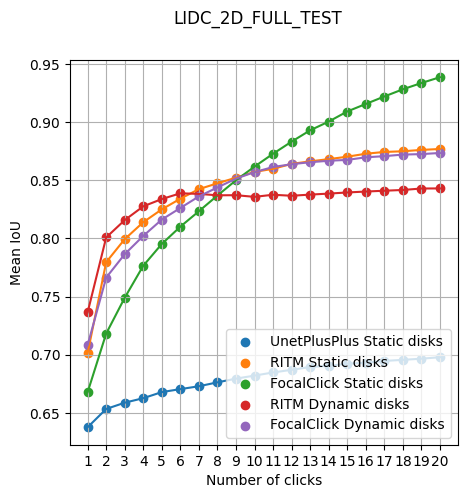

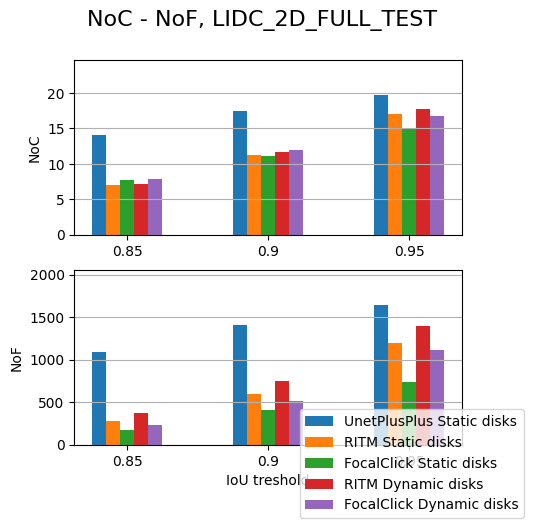

In [5]:
def visualise_dataset_summary(eval_results, title_keys):
    clicks = np.arange(1, 21)
    
    sample_run = eval_results[0][1]
    dataset_names = sample_run.iloc[:, 1].values
    
    iou_col_names = [f'iou_{i+1}_clicks' for i in range(20)]
    
    unique_datasets = np.unique(dataset_names)
    unique_datasets.sort()
    
    for dataset_name in unique_datasets:
        fig, ax = plt.subplots(1, len(title_keys), figsize=(len(title_keys)*5, 5), squeeze=False)
        # fig.suptitle(f'LIDC-2D model on KITS-2D-TUMOURS')
        fig.suptitle(f'{dataset_name}')
        
        for idx, (_, run) in enumerate(eval_results):
            rows = list(run.iterrows())
            for row_idx, row in enumerate(rows):
                if row[1]['dataset'] == dataset_name:
                    iou_values = row[1][iou_col_names].values
                    model_name = row[1]['model']
                    model_name = model_name.replace('BceDice loss', '')
                    model_name = model_name.replace('NormFocalLoss', '')
                    model_name = model_name.replace('FocalClick static ', '')
                    model_name = model_name.replace('ritm_standard aug', 'RITM augmentations')
                    model_name = model_name.replace('focalclick_standard aug', 'FocalClick augmentations')
                    model_name = model_name.replace('target_crop aug', 'Target Crop augmentations')
                    model_name = model_name.replace('Dynamic disks min', 'FocalClick Dynamic disks min')
                    ax[0, idx].plot(clicks, iou_values)
                    ax[0, idx].scatter(clicks, iou_values, label=model_name)
            ax[0, idx].set_title(title_keys[idx])
            ax[0, idx].set_xlabel('Number of clicks')
            ax[0, idx].set_ylabel('Mean IoU')
            ax[0, idx].set_xticks(clicks)
            ax[0, idx].grid()
            ax[0, idx].legend(loc='lower right')
            
    iou_thresholds = [0.85, 0.9, 0.95]
    noc_column_names = [f'NoC@{iou}' for iou in iou_thresholds]
    nof_column_names = [f'NoF@{iou}' for iou in iou_thresholds]        
    
    for dataset_name in unique_datasets:
        fig, ax = plt.subplots(2, len(title_keys), figsize=(len(title_keys)*5, 5), squeeze=False)
        fig.suptitle(f'NoC - NoF, {dataset_name}', fontsize=16)
        
        for idx, (_, run) in enumerate(eval_results):
            noc_values = []
            nof_values = []
            
            bar_width = 0.1
            multiplier = 0
            
            rows = list(run.iterrows())
            for row in rows:
                if row[1]['dataset'] == dataset_name:
                    noc = row[1][noc_column_names].values
                    nof = row[1][nof_column_names].values
                    model_name = row[1]['model']
                    
                    offset = bar_width * multiplier
                    ax[0, idx].bar(np.arange(len(noc)) + offset, noc, bar_width, label=model_name)
                    ax[1, idx].bar(np.arange(len(nof)) + offset, nof, bar_width, label=model_name)

                    noc_values.append(noc)
                    nof_values.append(nof)
                    multiplier += 1
            
            if len(eval_results) > 1:
                ax[0, idx].set_title(title_keys[idx])
            ax[0, idx].set_xticks(np.arange(len(noc)) + bar_width * (multiplier - 1) / 2)
            ax[0, idx].set_xticklabels([f'{iou}' for iou in iou_thresholds])
            ax[0, idx].set_ylabel('NoC')
            ax[0, idx].set_ylim([0.0, np.max(noc_values) * 1.25])
            ax[0, idx].grid(axis='y')
            # ax[0, idx].legend(loc='best')
            
            ax[1, idx].set_xticks(np.arange(len(nof)) + bar_width * (multiplier - 1) / 2)
            ax[1, idx].set_xticklabels([f'{iou}' for iou in iou_thresholds])
            ax[1, idx].set_xlabel('IoU treshold')
            ax[1, idx].set_ylabel('NoF')
            ax[1, idx].set_ylim([0.0, np.max(nof_values) * 1.25])
            ax[1, idx].grid(axis='y')
            # ax[1, idx].legend(loc='best')
        
        handles, labels = ax[0, idx].get_legend_handles_labels()
        bbox_y_offset = 0.5 if len(eval_results) > 1 else 0.8
        fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(bbox_y_offset, -0.05), ncol=len(title_keys))


visualise_dataset_summary(eval_results, title_keys)

STOP

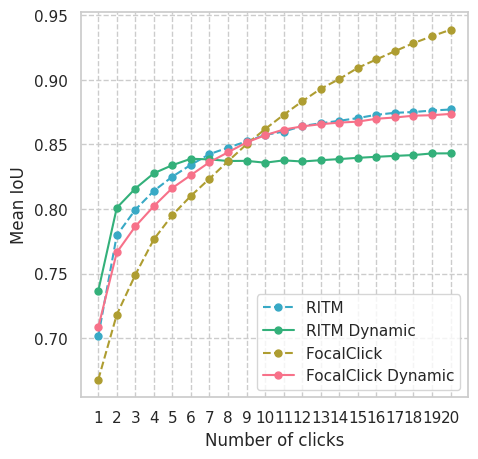

In [6]:
import seaborn as sns

def visualise_dataset_summary(eval_results, title_keys):
    sns.set(style="whitegrid")  # Set the visual style

    clicks = np.arange(1, 21)
    
    sample_run = eval_results[0][1]
    dataset_names = sample_run.iloc[:, 1].values
    
    iou_col_names = [f'iou_{i+1}_clicks' for i in range(20)]
    
    unique_datasets = np.unique(dataset_names)
    unique_datasets.sort()
    
    for dataset_name in unique_datasets:
        fig, ax = plt.subplots(1, len(title_keys), figsize=(len(title_keys)*5, 5), squeeze=False)
        title_dataset_name = dataset_name
        # fig.suptitle(title_dataset_name)
        
        for idx, (_, run) in enumerate(eval_results):
            # Create a color palette based on the base model names
            base_models = [model for model in run['model'].unique()]
            unique_base_models = sorted(set(base_models))
            color_palette = sns.color_palette("husl", n_colors=len(unique_base_models))
            model_color_map = {model: color_palette[i] for i, model in enumerate(unique_base_models)}

            rows = list(run.iterrows())
            rows = reversed(sorted(rows, key=lambda x: x[1]['model']))
            for row_idx, row in rows:
                if row['dataset'] == dataset_name:
                    iou_values = row[iou_col_names].values
                    model_name = row['model']
                    base_model_name = model_name
                    if model_name == 'UnetPlusPlus Static disks':
                        continue
                    model_name = model_name.replace('FocalClick static ', '')
                    model_name = model_name.replace('ritm_standard aug', 'RITM-based')
                    model_name = model_name.replace('focalclick_standard aug', 'FocalClick-based')
                    model_name = model_name.replace('target_crop aug', 'Target Crop')
                    color = model_color_map[base_model_name]
                    linestyle = '--' if "Static" in model_name else '-'
                    ax[0, idx].plot(clicks, iou_values, marker='o', markersize=5, linestyle=linestyle, color=color, label=model_name.replace('Static disks', '').replace('Dynamic disks', 'Dynamic'))
            
            ax[0, idx].set_xlabel('Number of clicks')
            ax[0, idx].set_ylabel('Mean IoU')
            ax[0, idx].set_xticks(clicks)
            ax[0, idx].legend(frameon=True)
            ax[0, idx].grid(True, linestyle='--')
    
    plt.show()

visualise_dataset_summary(eval_results, title_keys)

# Iou decrease investigation

In [8]:
import pandas as pd
import os

def find_iou_changes(dir_path, prefix1, prefix2, click_n):
    # Construct file paths
    file1 = [f for f in os.listdir(os.path.join(dir_path, 'metrics')) if f.startswith(prefix1)][0]
    file2 = [f for f in os.listdir(os.path.join(dir_path, 'metrics')) if f.startswith(prefix2)][0]
    
    # Load CSV files
    df1 = pd.read_csv(os.path.join(dir_path, 'metrics', file1))
    df2 = pd.read_csv(os.path.join(dir_path, 'metrics', file2))
    
    # Calculate change in IoU for each file
    df1['iou_change'] = df1[f'iou_{click_n}_clicks'] - df1[f'iou_{click_n-1}_clicks']
    df2['iou_change'] = df2[f'iou_{click_n}_clicks'] - df2[f'iou_{click_n-1}_clicks']
    
    # Identify cases where IoU increased in df1 and decreased in df2
    increased_in_df1 = df1[df1['iou_change'] > 0]
    decreased_in_df2 = df2[df2['iou_change'] < 0]
    
    common_cases = decreased_in_df2[decreased_in_df2.index.isin(increased_in_df1.index)]
    
    sorted_cases = common_cases.sort_values(by='iou_change', ascending=True)
    
    return sorted_cases[['iou_change']]

result = find_iou_changes(lidc_big_static_vs_dynamic, 'ritm', 'dynamic', 8)
print(len(result))
result.head(10)


FileNotFoundError: [Errno 2] No such file or directory: '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/evaluation/2024-03-09/16-23-19ritm_static_vs_dynamic_lidc_big/metrics'

In [ ]:
import pandas as pd
import os

def find_iou_changes(dir_path, prefix1, prefix2, click_n):
    # Construct file paths
    file1 = [f for f in os.listdir(os.path.join(dir_path, 'metrics')) if f.startswith(prefix1)][0]
    file2 = [f for f in os.listdir(os.path.join(dir_path, 'metrics')) if f.startswith(prefix2)][0]
    
    # Load CSV files
    df1 = pd.read_csv(os.path.join(dir_path, 'metrics', file1))
    df2 = pd.read_csv(os.path.join(dir_path, 'metrics', file2))
    
    # Calculate change in IoU for each file
    df1['iou_change'] = df1[f'iou_{click_n}_clicks'] - df1[f'iou_{click_n-1}_clicks']
    df2['iou_change'] = df2[f'iou_{click_n}_clicks'] - df2[f'iou_{click_n-1}_clicks']
    
    # Identify cases where IoU increased in df1 and decreased in df2
    increased_in_df1 = df1[df1['iou_change'] > 0]
    decreased_in_df2 = df2[df2['iou_change'] < 0]
    
    common_cases = decreased_in_df2[decreased_in_df2.index.isin(increased_in_df1.index)]
    
    sorted_cases = common_cases.sort_values(by='iou_change', ascending=True)
    
    return sorted_cases[['iou_change']]

result = find_iou_changes(lidc_big_static_vs_dynamic, 'ritm', 'dynamic', 8)
print(len(result))
result.head(10)

In [22]:
# dataset = utils.get_dataset('LIDC_2D_FULL_VAL', cfg)
dataset = utils.get_dataset('KITS23_2D_TUMOURS_VAL', cfg)
sample_sizes = np.empty((len(dataset)))
for i in range(len(dataset)):
    sample = dataset.get_sample(i)
    sample_sizes[i] = np.sum(sample.gt_mask)

In [26]:
print(f'idx by size{np.argsort(sample_sizes)}')

idx by size[ 0 34 42 15 13  4 47  5 36  3 48 44 32 26 31 24 22  6  9 17 27  7 30 40
  2 16 20 23 43 28 41  8 21 33 37 39 10 18 38 35 25 29 45 11 12 19  1 46
 14]


In [29]:
# prefix1 = 'FocalClick Static disks KITS23_2D_TUMOURS_FULL-KITS23_2D_TUMOURS_FULL_TEST.csv'
# prefix2 = 'FocalClick Dynamic disks KITS23_2D_TUMOURS_FULL-KITS23_2D_TUMOURS_FULL_TEST.csv'
prefix1 = 'RITM Static disks-LIDC_2D_TEST.csv'
prefix2 = 'RITM Dynamic disks-LIDC_2D_TEST.csv'
click_n = 1
results_df = lidc_small

file1 = [f for f in os.listdir(os.path.join(results_df, 'metrics')) if f.endswith(prefix1)][0]
file2 = [f for f in os.listdir(os.path.join(results_df, 'metrics')) if f.endswith(prefix2)][0]

# Load CSV files
df1 = pd.read_csv(os.path.join(results_df, 'metrics', file1))
df2 = pd.read_csv(os.path.join(results_df, 'metrics', file2))

# Calculate change in IoU for each file
# df1['iou_change'] = df1[f'iou_{click_n}_clicks'] - df1[f'iou_{click_n-1}_clicks']
# df2['iou_change'] = df2[f'iou_{click_n}_clicks'] - df2[f'iou_{click_n-1}_clicks']

df2['iou_diff'] = df2[f'iou_{click_n}_clicks'] - df1[f'iou_{click_n}_clicks']

# Identify cases where IoU increased in df1 and decreased in df2
# increased_in_df1 = df1[df1['iou_change'] > 0]
# decreased_in_df1 = df1[df1['iou_change'] <= 0]
# increased_in_df2 = df2[df2['iou_change'] > 0]
# decreased_in_df2 = df2[df2['iou_change'] <= 0]

# samples_to_analyze = df2[df2.index.isin(increased_in_df1.index)]['iou_change'] # increased in df1 changes of df2
# samples_to_analyze = df2['iou_change'] # all_df2
samples_to_analyze = df2['iou_diff']
# samples_to_analyze = df2[df2.index.isin(decreased_in_df1.index)]['iou_change'] # decreased in df1 changes of df2

samples_to_analyze = samples_to_analyze.sort_values(ascending=False)

print(samples_to_analyze.describe())
samples_to_analyze.head(30)

count    2436.000000
mean        0.043737
std         0.113583
min        -0.500000
25%        -0.009226
50%         0.013026
75%         0.066335
max         0.772495
Name: iou_diff, dtype: float64


363     0.772495
2406    0.761802
2323    0.743700
107     0.740000
2145    0.723146
1647    0.697900
263     0.694319
1834    0.673457
2023    0.667495
1060    0.647341
1901    0.624239
2324    0.612479
1750    0.604318
2362    0.601490
323     0.586495
2146    0.552841
652     0.538020
226     0.532507
1751    0.506155
308     0.496305
1660    0.493913
1121    0.486146
424     0.484473
2261    0.483462
2238    0.480005
31      0.474820
1013    0.465800
2200    0.463381
1963    0.457022
1152    0.455118
Name: iou_diff, dtype: float64

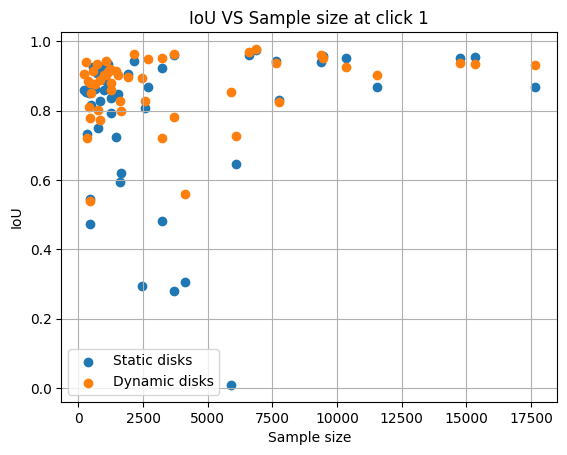

In [19]:
def plot_iou_correlation_with_sample_size(df1, df2, sample_sizes, click_n):
    fig, ax = plt.subplots(1, 1)
    ax.scatter(sample_sizes, df1[f'iou_{click_n}_clicks'], label='Static disks')
    ax.scatter(sample_sizes, df2[f'iou_{click_n}_clicks'], label='Dynamic disks')
    ax.set_xlabel('Sample size')
    ax.set_ylabel('IoU')
    ax.legend(loc='best')
    ax.grid()
    ax.set_title(f'IoU VS Sample size at click {click_n}')

plot_iou_correlation_with_sample_size(df1, df2, sample_sizes, 1)

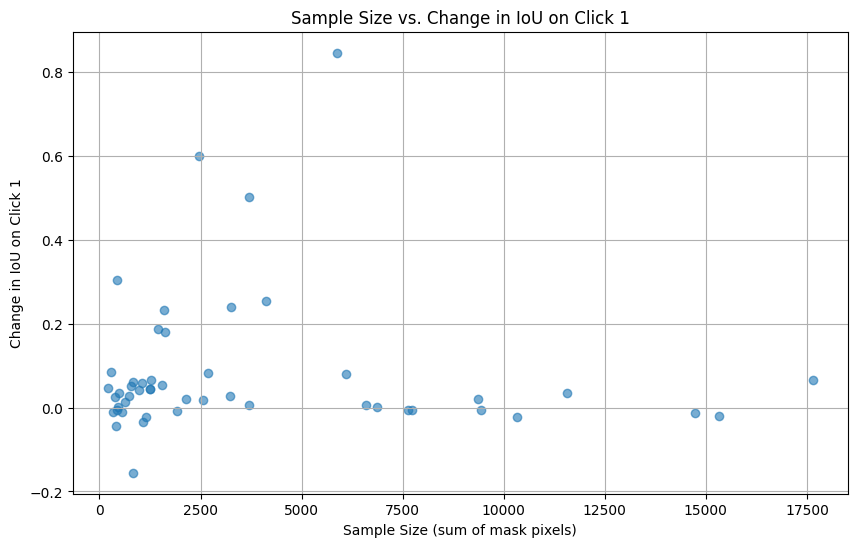

In [20]:

filtered_sample_sizes = np.take(sample_sizes, samples_to_analyze.index)

plt.figure(figsize=(10, 6))
plt.scatter(filtered_sample_sizes, samples_to_analyze, alpha=0.6)
plt.title(f'Sample Size vs. Change in IoU on Click {click_n}')
plt.xlabel('Sample Size (sum of mask pixels)')
plt.ylabel(f'Change in IoU on Click {click_n}')
plt.grid(True)
plt.show()


In [21]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

prefix1 = 'Static'
prefix2 = 'Dynamic'

# Load the first file that starts with each prefix from the 'metrics' subdirectory
file1 = [f for f in os.listdir(os.path.join(results_df, 'metrics')) if f.startswith(prefix1)][0]
file2 = [f for f in os.listdir(os.path.join(results_df, 'metrics')) if f.startswith(prefix2)][0]

# Load CSV files
df1 = pd.read_csv(os.path.join(results_df, 'metrics', file1))
df2 = pd.read_csv(os.path.join(results_df, 'metrics', file2))

# Calculate IoU changes for both dataframes
for df in [df1, df2]:
    for click_n in range(2, 21):
        df[f'iou_change_{click_n}'] = df[f'iou_{click_n}_clicks'] - df[f'iou_{click_n-1}_clicks']

# Initialize figure for animation with two subplots
fig, axs = plt.subplots(1, 2, figsize=(20, 6))  # Two subplots side by side
plt.close()

# Set titles and labels
axs[0].set_title('DF1: Sample Size vs. Change in IoU')
axs[1].set_title('DF2: Sample Size vs. Change in IoU')
for ax in axs:
    ax.set_xlabel('Sample Size (sum of mask pixels)')
    ax.set_ylabel('Change in IoU')
    ax.grid(True)

# Function to update the plot for each frame
def update(click_n):
    
    fig.suptitle(f'Change IoU from click {click_n - 1} to {click_n}', fontsize=16)
    
    for i, ax in enumerate(axs):
        ax.clear()
        ax.grid(True)
        ax.set_ylim([-1, 1])
        ax.set_xlabel('Sample Size (sum of mask pixels)')
        ax.set_ylabel(f'Change in IoU on Click {click_n}')

        # Select the appropriate DataFrame
        df = df1 if i == 0 else df2
        if i == 0:
            ax.set_title('Static size disks')
        else:
            ax.set_title('Dynamic size disks')

        # Use the current click's IoU change for plotting
        samples_to_analyze = df[f'iou_change_{click_n}']

        # Assuming 'sample_sizes' is defined and matches the indexes in the dataframes
        filtered_sample_sizes = np.take(sample_sizes, samples_to_analyze.index)

        # Scatter plot for the current frame
        ax.scatter(filtered_sample_sizes, samples_to_analyze, alpha=0.4)

        # Calculate and plot the average IoU change
        avg_iou_change = samples_to_analyze.mean()
        ax.axhline(avg_iou_change, color='r' if avg_iou_change <=0 else 'g', label=f'Avg IoU Change: {avg_iou_change:.5f}')
        ax.legend()

# Create animation, starting from the 2nd click
ani = FuncAnimation(fig, update, frames=range(2, 21), interval=5000, repeat=False)

# To display the animation in a Jupyter notebook, use the following:
from IPython.display import HTML
HTML(ani.to_jshtml())

# To save the animation as a .gif or .mp4 file, use the following:
# ani.save('iou_changes_animation.gif', writer='imagemagick')
# ani.save('iou_changes_animation.mp4', writer='ffmpeg')


In [ ]:
ani.save('iou_changes_animation.gif', writer='imagemagick')

# Per mask size / connected components evaluation

In [22]:
import scipy.ndimage as ndimage
sample_sizes = np.empty(len(dataset))
connected_components_counts = np.empty(len(dataset))

for i in range(len(dataset)):
    sample = dataset.get_sample(i)
    sample_sizes[i] = np.sum(sample.gt_mask)
    labeled_array, num_features = ndimage.label(sample.gt_mask)
    connected_components_counts[i] = num_features


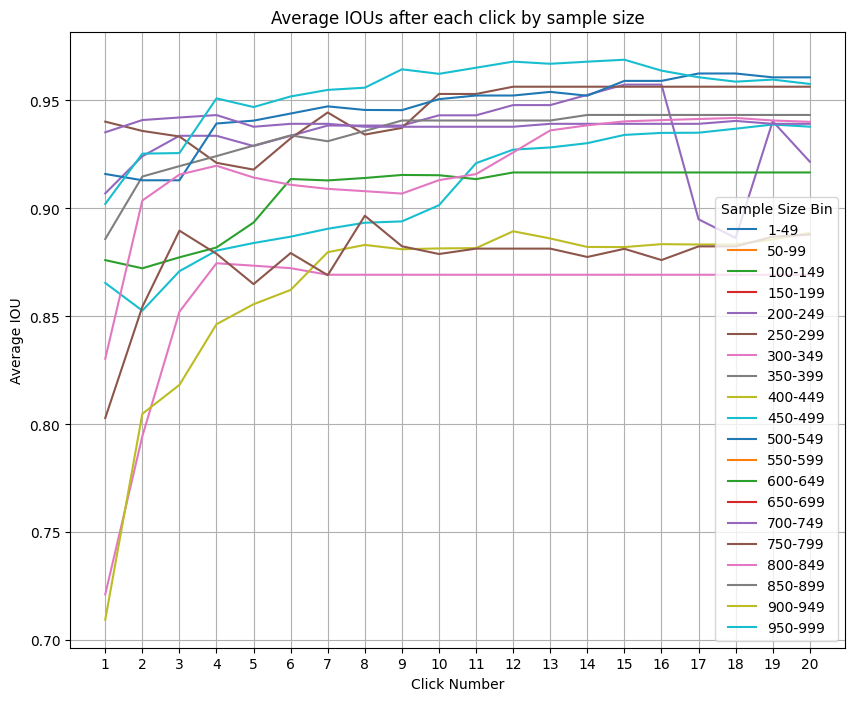

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

results_df = kits_small_static_vs_dynamic
df_path = [f for f in os.listdir(os.path.join(results_df, 'metrics')) if f.startswith('Dynamic')][0]
df = pd.read_csv(os.path.join(results_df, 'metrics', df_path))

df['sample_size'] = sample_sizes
bins = [0, 49, 99, 149, 199, 249, 299, 349, 399, 449, 499, 549, 599, 649, 699, 749, 799, 849, 899, 949, 999]
bin_labels = ['1-49', '50-99', '100-149', '150-199', '200-249', '250-299', '300-349', '350-399', '400-449', '450-499', '500-549', '550-599', '600-649', '650-699', '700-749', '750-799', '800-849', '850-899', '900-949', '950-999']

df['size_bin'] = pd.cut(df['sample_size'], bins=bins, labels=bin_labels, right=False)

average_ious_per_bin = df.groupby('size_bin').mean()
click_columns = [col for col in df.columns if 'iou' in col]

plt.figure(figsize=(10, 8))

for bin_label in bin_labels:
    if bin_label in average_ious_per_bin.index:
        plt.plot(range(1, 21), average_ious_per_bin.loc[bin_label, click_columns], label=bin_label)

plt.xlabel('Click Number')
plt.ylabel('Average IOU')
plt.title('Average IOUs after each click by sample size')
plt.legend(title='Sample Size Bin')
plt.xticks(range(1, 21))
plt.grid(True)
plt.show()

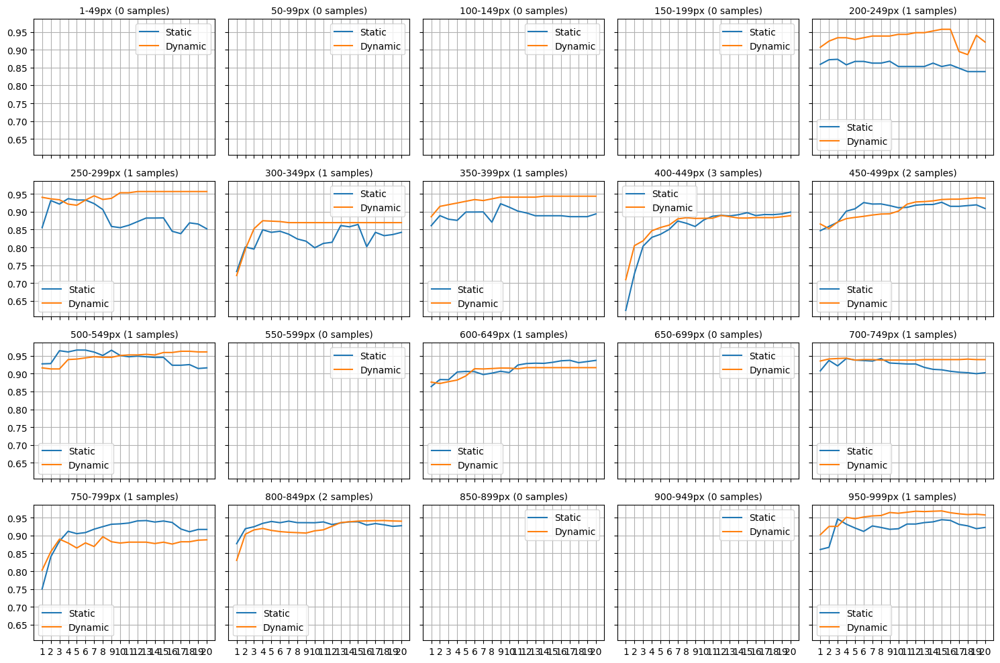

In [27]:
df_path = [f for f in os.listdir(os.path.join(results_df, 'metrics')) if f.startswith('Static')][0]
df1 = pd.read_csv(os.path.join(results_df, 'metrics', df_path))

df_path = [f for f in os.listdir(os.path.join(results_df, 'metrics')) if f.startswith('Dynamic')][0]
df2 = pd.read_csv(os.path.join(results_df, 'metrics', df_path))

df1['sample_size'] = sample_sizes
df2['sample_size'] = sample_sizes

df1['size_bin'] = pd.cut(df1['sample_size'], bins=bins, labels=bin_labels, right=False)
df2['size_bin'] = pd.cut(df2['sample_size'], bins=bins, labels=bin_labels, right=False)

# Calculate the average IOUs for each click in each size bin
average_ious_per_bin1 = df1.groupby('size_bin').mean()
average_ious_per_bin2 = df2.groupby('size_bin').mean()

fig, axes = plt.subplots(4, 5, figsize=(15, 10), sharex=True, sharey=True)
axes = axes.flatten()

plt.setp(axes, xticks=range(1, 21, 1), yticks=np.arange(0.6, 1.01, 0.05))

for i, bin_label in enumerate(bin_labels):
    ax = axes[i]
    
    if bin_label in average_ious_per_bin.index:
        ax.set_title(f'{bin_label}px ({df1[df1["size_bin"] == bin_label].shape[0]} samples)', fontsize=10)
        ax.plot(range(1, 21), average_ious_per_bin1.loc[bin_label, click_columns], label='Static')
        ax.plot(range(1, 21), average_ious_per_bin2.loc[bin_label, click_columns], label='Dynamic')
        ax.grid(True)
        ax.legend()

plt.tight_layout()

plt.show()

# Per click look

In [17]:
def find_run_by_progressive_mode(run_path, start_progressive_merge):
        for dir in os.listdir(run_path):
            if os.path.isdir(os.path.join(run_path, dir)):
                run_dir = os.path.join(run_path, dir)
                with open(os.path.join(run_dir, '.hydra', 'overrides.yaml')) as f:
                    overrides = f.readlines()
                for override in overrides:
                    if 'start_progressive_merge' in override:
                        if int(override.strip().split('=')[1]) == start_progressive_merge:
                            return run_dir
        return None

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import base64

def show_animation(animation):
    html = animation.to_jshtml()
    
    return HTML(html)

def show_animation_from_file(filename):
    
    with open(filename, 'rb') as f:
        gif_data = f.read()

    gif_base64 = base64.b64encode(gif_data).decode('utf-8')

    html_code = f'<img src="data:image/gif;base64,{gif_base64}">'
    return HTML(html_code)

def save_animation(animation, filename):
    animation.save(f'{filename}.gif', writer='pillow')

In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.animation import FuncAnimation

def visualise_iou_distribution_by_click(run_path, model, dataset, start_progressive_merge=-1):
    
    if 'multirun' in run_path:
        run_dir = find_run_by_progressive_mode(run_path, start_progressive_merge)
    else:
        run_dir = run_path

    if run_dir is None:
        print('Run not found')
        return
    
    metrics_path = f'{run_dir}/metrics/{model}-{dataset}.csv'
    metrics_df = pd.read_csv(metrics_path)
    metrics_df['sample_id'] = metrics_df.index
    metrics_df.set_index('sample_id', inplace=True)

    # Calculate average IoUs for each click and determine the maximum average value
    avg_ious = metrics_df.filter(like="iou_").mean()
    
    fig = plt.figure(figsize=(12, 7))
    grid = plt.GridSpec(5, 4, wspace=0.5, hspace=0.5)
    
    main_ax = fig.add_subplot(grid[:-2, 1:-1])  # Centering the main plot
    x_hist = fig.add_subplot(grid[-2, 1:-1], sharex=main_ax)  # Centering the x histogram
    x_kde = fig.add_subplot(grid[-1, 1:-1], sharex=main_ax)  # Centering the KDE

    plt.close()
    
    prev_iou_values = metrics_df[f'iou_{1}_clicks'].values

    def update(idx):
        click = idx + 1
        click_col = f'iou_{click}_clicks'
        iou_values = metrics_df[click_col].values
        
        # Calculate the maximum average IoU achieved up to the current click
        max_avg_iou_up_to_current = avg_ious.iloc[:click].max()
        # Calculate the average IoU for the current click
        current_avg_iou = iou_values.mean()
        
        # Adding jitter to y-values
        y_values = np.arange(len(iou_values)) + np.random.normal(0, 0.3, size=len(iou_values))
        
        main_ax.clear()
        x_hist.clear()
        x_kde.clear()
        
        # Scatter plot
        main_ax.scatter(prev_iou_values, y_values, alpha=0.6, label='Previous IoU', color='blue', s=15)
        main_ax.scatter(iou_values, y_values, alpha=0.6, label='Current IoU', color='red', s=15)
        
        # Highlight movement with lines
        for i, (prev, curr) in enumerate(zip(prev_iou_values, iou_values)):
            if curr > prev:
                color = 'green'
            else:
                color = 'red'
            main_ax.plot([prev, curr], [y_values[i], y_values[i]], color, alpha=0.5)
        
        main_ax.set_title(f'Click {click} IoU distribution, {model}, {dataset}')
        main_ax.set_xlabel('IoU')
        main_ax.set_ylabel('Sample ID')
        main_ax.grid(True)

        # Histograms
        x_hist.hist(iou_values, bins=50, align='mid', color='red', alpha=0.6, label='Current IoU')
        x_hist.hist(prev_iou_values, bins=50, align='mid', color='blue', alpha=0.6, label='Previous IoU')
        
        # KDE plot for IoU values
        sns.kdeplot(iou_values, ax=x_kde, color='red', fill=True)
        sns.kdeplot(prev_iou_values, ax=x_kde, color='blue', fill=True)

        # Set the y-axis for histograms to be visible
        x_hist.yaxis.set_visible(True)
        x_kde.yaxis.set_visible(True)

        # Set x-axis limits for padding
        main_ax.set_xlim(-0.1, 1.1)

        # Draw a vertical line indicating the maximum average IoU achieved up to current click
        main_ax.axvline(max_avg_iou_up_to_current, color='green', linestyle='-', alpha=0.8, label='Max achieved Mean IoU')

        # Draw a vertical line indicating the average IoU of the current click
        main_ax.axvline(current_avg_iou, color='purple', linestyle='--', alpha=0.5, label='Mean IoU of current click')

        # Add legend outside to the right of the plot
        main_ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        
        # Calculate counts for samples above and below current mean IoU
        above_current_mean = np.sum(iou_values > current_avg_iou)
        below_current_mean = len(iou_values) - above_current_mean
        
        info_str = f'Samples above current mean IoU: {above_current_mean}\n'
        info_str += f'Samples below current mean IoU: {below_current_mean}'

        failure_case_ids = np.where(iou_values < 0.4)[0]
        if len(failure_case_ids) > 0:
            info_str += '\n\nFailure cases:\n'
            for case_id in failure_case_ids:
                info_str += f'{case_id}, '
            info_str = info_str[:-2]
        
        # Add the information as a textbox below the legend
        main_ax.text(1.05, 0.3, info_str, transform=main_ax.transAxes, fontsize=9, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
        
        # Update prev_iou_values for the next frame
        prev_iou_values[:] = iou_values

        return main_ax, x_hist, x_kde

    animation = FuncAnimation(fig, update, frames=20, interval=1000, blit=False)
    return animation


animation = visualise_iou_distribution_by_click(fresh_dataset_dynamic_vs_standard, 'dynamic clicks BceDice loss', 'LIDC_2D_VAL', -1)
show_animation(animation)

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.animation import FuncAnimation

def visualise_iou_distribution_for_models(run_path, model1, model2, dataset, start_progressive_merge=-1):
    if 'multirun' in run_path:
        run_dir = find_run_by_progressive_mode(run_path, start_progressive_merge)
    else:
        run_dir = run_path

    if run_dir is None:
        print('Run not found')
        return
    
    # Load the data for both models
    metrics_path1 = f'{run_dir}/metrics/{model1}-{dataset}.csv'
    metrics_path2 = f'{run_dir}/metrics/{model2}-{dataset}.csv'
    
    metrics_df1 = pd.read_csv(metrics_path1)
    metrics_df1['sample_id'] = metrics_df1.index
    metrics_df1.set_index('sample_id', inplace=True)
    metrics_df2 = pd.read_csv(metrics_path2)
    metrics_df2['sample_id'] = metrics_df2.index
    metrics_df2.set_index('sample_id', inplace=True)
    
    fig = plt.figure(figsize=(24, 7))
    grid = plt.GridSpec(5, 8, wspace=0.5, hspace=0.5)  # Adjusted for two sets of plots
    
    # Define axes for both models without the KDE plots
    main_ax1 = fig.add_subplot(grid[:-1, 1:3])
    x_hist1 = fig.add_subplot(grid[-1, 1:3], sharex=main_ax1)

    main_ax2 = fig.add_subplot(grid[:-1, 5:7])
    x_hist2 = fig.add_subplot(grid[-1, 5:7], sharex=main_ax2)
    
    plt.close()

    # Initial previous IoU values
    prev_iou_values1 = metrics_df1[f'iou_{1}_clicks'].values
    prev_iou_values2 = metrics_df2[f'iou_{1}_clicks'].values
    

    def update(idx):
        sample_ids_iou_diff = []
        
        click = idx + 1
        for main_ax, x_hist, metrics_df, prev_iou_values, model_name in [
            (main_ax1, x_hist1, metrics_df1, prev_iou_values1, model1),
            (main_ax2, x_hist2, metrics_df2, prev_iou_values2, model2)
        ]:
            click_col = f'iou_{click}_clicks'
            iou_values = metrics_df[click_col].values

            # Calculate the maximum average IoU achieved up to the current click
            avg_ious = metrics_df.filter(like="iou_").mean()
            max_avg_iou_up_to_current = avg_ious.iloc[:click].max()

            # Calculate the average IoU for the current click
            current_avg_iou = iou_values.mean()

            # Adding jitter to y-values
            y_values = np.arange(len(iou_values)) + np.random.normal(0, 0.3, size=len(iou_values))

            main_ax.clear()
            x_hist.clear()

            # Scatter plot
            main_ax.scatter(prev_iou_values, y_values, alpha=0.6, label='Previous IoU', color='blue', s=15)
            main_ax.scatter(iou_values, y_values, alpha=0.6, label='Current IoU', color='red', s=15)

            # Highlight movement with lines
            for i, (prev, curr) in enumerate(zip(prev_iou_values, iou_values)):
                if curr > prev:
                    color = 'green'
                else:
                    color = 'red'
                main_ax.plot([prev, curr], [y_values[i], y_values[i]], color, alpha=0.5)
                
                # Track sample IDs where IoU increased for model1 but decreased for model2
                if model_name == model1 and curr > prev:
                    if metrics_df2[click_col].iloc[i] < prev_iou_values2[i]:
                        if i not in sample_ids_iou_diff:
                            sample_ids_iou_diff.append((i, np.round(metrics_df2[click_col].iloc[i] - prev_iou_values2[i], 3)))

            main_ax.set_title(f'Click {click} IoU distribution, {model_name}, {dataset}')
            main_ax.set_xlabel('IoU')
            main_ax.set_ylabel('Sample ID')
            main_ax.grid(True)

            # Histograms
            x_hist.hist(iou_values, bins=50, align='mid', color='red', alpha=0.6, label='Current IoU')
            x_hist.hist(prev_iou_values, bins=50, align='mid', color='blue', alpha=0.6, label='Previous IoU')

            # Set the y-axis for histograms to be visible
            x_hist.yaxis.set_visible(True)

            # Set x-axis limits for padding
            main_ax.set_xlim(-0.1, 1.1)

            # Draw a vertical line indicating the maximum average IoU achieved up to current click
            main_ax.axvline(max_avg_iou_up_to_current, color='purple', linestyle='--', alpha=0.5, label='Max Avg IoU up to Current Click')

            # Draw a vertical line indicating the average IoU of the current click
            main_ax.axvline(current_avg_iou, color='green', linestyle='-', alpha=0.8, label='Avg IoU of Current Click')

            # Add legend outside to the right of the plot
            main_ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            
            # Calculate counts for samples above and below current mean IoU
            above_current_mean = np.sum(iou_values > current_avg_iou)
            below_current_mean = len(iou_values) - above_current_mean

            info_str = f'Samples above current mean IoU: {above_current_mean}\n'
            info_str += f'Samples below current mean IoU: {below_current_mean}'

            # Add the information as a textbox below the legend
            main_ax.text(1.05, 0.3, info_str, transform=main_ax.transAxes, fontsize=9, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

            # Update prev_iou_values for the next frame
            prev_iou_values[:] = iou_values
            
            print(f"CLICK {click}: Sample IDs where IoU increased for the first model but decreased for the second model:", sample_ids_iou_diff)

        return main_ax1, x_hist1, main_ax2, x_hist2

    animation = FuncAnimation(fig, update, frames=20, interval=1000, blit=False)
    return animation

# Call the function with two models

animation = visualise_iou_distribution_for_models(dynamic_vs_overwrite_vs_pos_dynamic, 'dynamic clicks BceDice loss', 'dynamic clicks overwrite maps', 'LIDC_2D_VAL', -1)
show_animation(animation)


CLICK 1: Sample IDs where IoU increased for the first model but decreased for the second model: []
CLICK 1: Sample IDs where IoU increased for the first model but decreased for the second model: []
CLICK 1: Sample IDs where IoU increased for the first model but decreased for the second model: []
CLICK 1: Sample IDs where IoU increased for the first model but decreased for the second model: []
CLICK 2: Sample IDs where IoU increased for the first model but decreased for the second model: [(6, -0.01), (19, -0.047), (40, -0.005), (42, -0.013)]
CLICK 2: Sample IDs where IoU increased for the first model but decreased for the second model: [(6, -0.01), (19, -0.047), (40, -0.005), (42, -0.013)]
CLICK 3: Sample IDs where IoU increased for the first model but decreased for the second model: [(0, -0.0), (1, -0.0), (2, -0.021), (8, -0.012), (10, -0.016), (12, -0.002), (17, -0.007), (29, -0.008), (31, -0.102), (39, -0.005), (42, -0.041), (44, -0.012), (49, -0.0), (52, -0.016), (55, -0.041)]
CLICK

CLICK 4: Sample IDs where IoU increased for the first model but decreased for the second model: [(1, -0.004), (8, -0.006), (14, -0.002), (21, -0.006), (27, -0.002), (29, -0.036), (40, -0.0), (41, -0.008), (49, -0.002), (50, -0.001), (52, -0.003)]
CLICK 4: Sample IDs where IoU increased for the first model but decreased for the second model: [(1, -0.004), (8, -0.006), (14, -0.002), (21, -0.006), (27, -0.002), (29, -0.036), (40, -0.0), (41, -0.008), (49, -0.002), (50, -0.001), (52, -0.003)]
CLICK 5: Sample IDs where IoU increased for the first model but decreased for the second model: [(16, -0.014), (24, -0.004), (32, -0.011)]
CLICK 5: Sample IDs where IoU increased for the first model but decreased for the second model: [(16, -0.014), (24, -0.004), (32, -0.011)]
CLICK 6: Sample IDs where IoU increased for the first model but decreased for the second model: [(9, -0.002), (11, -0.02), (55, -0.003)]
CLICK 6: Sample IDs where IoU increased for the first model but decreased for the second mo

In [17]:
dataset = utils.get_dataset('LIDC_2D_VAL', cfg)
sample_sizes = np.empty((len(dataset)))
for i in range(len(dataset)):
    sample = dataset.get_sample(i)
    sample_sizes[i] = np.sum(sample.gt_mask)

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.colors import Normalize, LogNorm
import matplotlib.cm as cm

def visualise_iou_distribution_by_click(run_path, model, dataset, sample_sizes, start_progressive_merge=-1):
    
    if 'multirun' in run_path:
        run_dir = find_run_by_progressive_mode(run_path, start_progressive_merge)
    else:
        run_dir = run_path

    if run_dir is None:
        print('Run not found')
        return
    
    metrics_path = f'{run_dir}/metrics/{model}-{dataset}.csv'
    metrics_df = pd.read_csv(metrics_path)
    metrics_df['sample_id'] = metrics_df.index
    metrics_df.set_index('sample_id', inplace=True)

    fig, main_ax = plt.figure(figsize=(12, 7)), plt.gca()
    plt.close()
    
    
    # Normalize sample_sizes for color mapping
    iou_values = metrics_df['iou_1_clicks'].values
    y_values = np.arange(len(iou_values)) + np.random.normal(0, 0.3, size=len(iou_values))
    
    cmap = cm.viridis
    # norm = Normalize(vmin=min(sample_sizes), vmax=max(sample_sizes))
    norm = LogNorm(vmin=min(sample_sizes[sample_sizes > 0]), vmax=max(sample_sizes))
    colors = cmap(norm(sample_sizes))
    scatter = main_ax.scatter(iou_values, y_values, alpha=0.6, c=colors, s=15)
    
    cbar = fig.colorbar(scatter, ax=main_ax, orientation='vertical')
    cbar.set_label('Normalized GT Mask Size')

    def update(idx):
        click = idx + 1
        click_col = f'iou_{click}_clicks'
        iou_values = metrics_df[click_col].values

        # Adding jitter to y-values
        y_values = np.arange(len(iou_values)) + np.random.normal(0, 0.3, size=len(iou_values))
        
        main_ax.clear()

        # Scatter plot with colors based on normalized GT mask sizes
        
        scatter = main_ax.scatter(iou_values, y_values, alpha=0.6, c=colors, s=15)
        
        main_ax.set_title(f'Click {click} IoU distribution, {model}, {dataset}')
        main_ax.set_xlabel('IoU')
        main_ax.set_ylabel('Sample ID')
        main_ax.grid(True)
        main_ax.set_xlim(-0.1, 1.1)

        return main_ax

    animation = FuncAnimation(fig, update, frames=20, interval=1000, blit=False)
    return animation

# Example usage
animation = visualise_iou_distribution_by_click(dynamic_click_bugfix, 'dynamic clicks after_bugfix standard loss', 'LIDC_2D_VAL', sample_sizes, -1)
show_animation(animation)


In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.colors import Normalize, LogNorm
import matplotlib.cm as cm

def visualise_iou_distribution_by_click(run_path, model, dataset, sample_sizes, start_progressive_merge=-1):
    
    if 'multirun' in run_path:
        run_dir = find_run_by_progressive_mode(run_path, start_progressive_merge)
    else:
        run_dir = run_path

    if run_dir is None:
        print('Run not found')
        return
    
    metrics_path = f'{run_dir}/metrics/{model}-{dataset}.csv'
    metrics_df = pd.read_csv(metrics_path)

    fig, main_ax = plt.figure(figsize=(12, 7)), plt.gca()

    plt.close()
    
    iou_values = metrics_df['iou_1_clicks'].values
    y_values = np.arange(len(iou_values)) + np.random.normal(0, 0.3, size=len(iou_values))
    
    # Normalize sample_sizes for color mapping
    norm = LogNorm(vmin=min(sample_sizes[sample_sizes > 0]), vmax=max(sample_sizes))
    cmap = cm.viridis
    
    colors = cmap(norm(sample_sizes))
    
    scatter = main_ax.scatter(iou_values, y_values, alpha=0.6, c=colors, s=15)
    cbar = fig.colorbar(scatter, ax=main_ax, orientation='vertical')
    cbar.set_label('Normalized GT Mask Size')

    def update(idx):
        click = idx + 1
        click_col = f'iou_{click}_clicks'
        iou_values = metrics_df[click_col].values

        # Use sample_sizes directly for y-values
        y_values = sample_sizes
        colors = cmap(norm(sample_sizes))

        main_ax.clear()

        # Scatter plot with colors based on normalized GT mask sizes
        scatter = main_ax.scatter(iou_values, y_values, alpha=0.8, c=colors, s=15)
        
        main_ax.set_title(f'Click {click} IoU distribution, {model}, {dataset}')
        main_ax.set_xlabel('IoU')
        main_ax.set_ylabel('Sample Size')
        main_ax.grid(True)
        main_ax.set_yscale('log')
        main_ax.set_xlim(-0.1, 1.1)

        return main_ax

    animation = FuncAnimation(fig, update, frames=20, interval=1000, blit=False)
    return animation

# Example usage
animation = visualise_iou_distribution_by_click(dynamic_click_bugfix, 'dynamic clicks after_bugfix standard loss', 'LIDC_2D_VAL', sample_sizes, -1)
show_animation(animation)
